In [37]:
# for loading/processing the images  
from keras.preprocessing.image import load_img 
from keras.preprocessing.image import img_to_array 
from keras.applications.vgg16 import preprocess_input 

# models 
from keras.applications.vgg16 import VGG16 
from keras.models import Model

# clustering and dimension reduction
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# for everything else
import os
import numpy as np
import matplotlib.pyplot as plt
from random import randint
import pandas as pd
import pickle

In [38]:
path = r"/content/drive/MyDrive/clusters"
# change the working directory to the path where the images are located
os.chdir(path)

# this list holds all the image filename
test100 = []

# creates a ScandirIterator aliased as files
with os.scandir(path) as files:
  # loops through each file in the directory
    for file in files:
        if file.name.endswith('.jpg'):
          # adds only the image files to the flowers list
            test100.append(file.name)

In [39]:
print(test100[:10])

['cat_0085.jpg', 'cat_0066.jpg', 'cat_0081.jpg', 'cat_0073.jpg', 'cat_0047.jpg', 'cat_0061.jpg', 'cat_0091.jpg', 'cat_0002.jpg', 'cat_0006.jpg', 'cat_0028.jpg']


In [40]:
import random
random.shuffle(test100)
print(test100[:10])

['flower_0067.jpg', 'person_0057.jpg', 'person_0069.jpg', 'cat_0029.jpg', 'cat_0006.jpg', 'dog_0015.jpg', 'person_0044.jpg', 'dog_0087.jpg', '009 (3).jpg', 'flower_0013.jpg']


In [41]:
# load the image as a 224x224 array
img = load_img(test100[0], target_size=(224,224))
# convert from 'PIL.Image.Image' to numpy array
img = np.array(img)

print(img.shape)
(224, 224, 3)

(224, 224, 3)


(224, 224, 3)

In [42]:
reshaped_img = img.reshape(1,224,224,3)
print(reshaped_img.shape)
(1, 224, 224, 3)

(1, 224, 224, 3)


(1, 224, 224, 3)

In [43]:
x = preprocess_input(reshaped_img)

In [44]:
# load the model first and pass as an argument
model = VGG16()
model = Model(inputs = model.inputs, outputs = model.layers[-2].output)

def extract_features(file, model):
    # load the image as a 224x224 array
    img = load_img(file, target_size=(224,224))
    # convert from 'PIL.Image.Image' to numpy array
    img = np.array(img) 
    # reshape the data for the model reshape(num_of_samples, dim 1, dim 2, channels)
    reshaped_img = img.reshape(1,224,224,3) 
    # prepare image for model
    imgx = preprocess_input(reshaped_img)
    # get the feature vector
    features = model.predict(imgx, use_multiprocessing=True)
    return features

In [45]:
data = {}
p = r"/content/drive/MyDrive/clusters"

# lop through each image in the dataset
for test in test100:
    # try to extract the features and update the dictionary
    try:
        feat = extract_features(test,model)
        data[test] = feat
    # if something fails, save the extracted features as a pickle file (optional)
    except:
        with open(p,'wb') as file:
            pickle.dump(data,file)

In [46]:
# get a list of the filenames
filenames = np.array(list(data.keys()))

# get a list of just the features
feat = np.array(list(data.values()))
feat.shape
#(500, 1, 4096)

(500, 1, 4096)

In [47]:
# reshape so that there are 210 samples of 4096 vectors
feat = feat.reshape(-1,4096)
feat.shape
#(500, 4096)


(500, 4096)

In [48]:
import time

In [49]:
pca = PCA(n_components=100, random_state=22)
pca.fit(feat)
x = pca.transform(feat)

In [50]:
kmeans = KMeans(n_clusters=5, random_state=22)
start_time = time.time()
kmeans.fit(x)
print("  %s seconds " % (time.time() - start_time))

  0.2086014747619629 seconds 


In [51]:
print('Общее количесвто изображений: ', len(kmeans.labels_), '\n Метки каждой точки: \n', kmeans.labels_, '\n Координаты центров кластеров: \n',  kmeans.cluster_centers_, '\n Сумма квадратов расстояний от выборок до центра их ближайшего кластера: ', kmeans.inertia_, '\n Количество выполненных итераций: ', kmeans.n_iter_)

Общее количесвто изображений:  500 
 Метки каждой точки: 
 [1 3 3 0 0 4 3 4 2 1 3 4 4 1 4 2 0 0 0 1 3 3 3 4 0 4 4 3 4 0 4 3 1 2 0 2 2
 0 1 1 2 1 3 0 0 3 2 0 3 4 4 0 4 3 2 0 4 4 0 0 0 3 1 2 1 2 1 2 3 4 0 1 1 2
 4 4 3 1 3 2 1 1 0 2 0 2 0 2 0 0 2 1 3 0 4 1 0 3 4 4 1 4 1 1 0 1 3 2 2 0 1
 1 2 2 2 1 2 0 4 0 3 0 1 1 3 2 4 4 2 2 4 2 0 2 4 4 4 0 4 4 2 1 1 4 4 1 1 1
 3 3 4 1 3 0 1 2 4 1 1 4 2 0 1 4 4 2 4 0 1 4 2 2 2 1 2 1 4 4 1 3 3 2 3 3 0
 0 2 0 4 4 2 3 4 3 3 0 3 0 1 2 3 2 4 0 2 1 3 0 0 3 1 0 0 3 3 1 1 2 3 2 0 0
 0 2 2 0 3 3 0 1 0 3 0 3 0 2 3 4 3 0 4 4 2 3 4 3 0 3 4 1 1 4 1 0 4 1 1 3 4
 3 4 2 2 4 2 4 0 3 2 0 3 3 1 4 1 1 0 0 4 0 1 4 1 0 3 3 3 0 4 4 1 4 4 2 1 3
 1 1 0 3 1 4 4 1 1 3 0 2 2 3 4 2 4 3 2 2 3 1 0 0 2 2 2 4 2 1 2 1 2 3 1 0 4
 0 2 3 3 1 1 1 2 4 3 0 3 4 1 0 4 0 1 2 0 3 2 1 2 0 2 4 1 2 2 4 4 4 1 4 3 0
 1 2 2 0 1 0 1 2 1 0 3 2 1 1 0 4 4 3 1 3 1 2 1 0 4 3 3 4 1 4 4 1 0 1 3 4 4
 4 3 2 1 1 0 1 4 2 3 2 3 1 0 0 3 0 2 3 3 0 3 2 1 1 3 2 0 0 2 2 4 4 1 3 3 4
 4 2 2 2 3 4 3 0 1 0 2 1 4 3 2 2 3 1 4 0 

In [52]:
# holds the cluster id and the images { id: [images] }
groups = {}
for file, cluster in zip(filenames,kmeans.labels_):
    if cluster not in groups.keys():
        groups[cluster] = []
        groups[cluster].append(file)
    else:
        groups[cluster].append(file)

In [53]:
groups[0]

['cat_0029.jpg',
 'cat_0006.jpg',
 'cat_0078.jpg',
 'cat_0067.jpg',
 'cat_0048.jpg',
 'cat_0025.jpg',
 'cat_0083.jpg',
 'cat_0098.jpg',
 'cat_0077.jpg',
 'cat_0096.jpg',
 'cat_0049.jpg',
 'cat_0037.jpg',
 'cat_0051.jpg',
 'cat_0009.jpg',
 'cat_0033.jpg',
 'cat_0012.jpg',
 'cat_0063.jpg',
 'cat_0061.jpg',
 'cat_0013.jpg',
 'cat_0064.jpg',
 'cat_0062.jpg',
 'cat_0047.jpg',
 'cat_0044.jpg',
 'cat_0087.jpg',
 'cat_0082.jpg',
 'cat_0079.jpg',
 'cat_0080.jpg',
 'cat_0060.jpg',
 'cat_0059.jpg',
 'cat_0055.jpg',
 'cat_0066.jpg',
 'cat_0022.jpg',
 'cat_0034.jpg',
 'cat_0005.jpg',
 'cat_0041.jpg',
 'cat_0032.jpg',
 'cat_0004.jpg',
 'cat_0007.jpg',
 'cat_0068.jpg',
 'cat_0019.jpg',
 'cat_0076.jpg',
 'cat_0010.jpg',
 'cat_0020.jpg',
 'cat_0073.jpg',
 'cat_0050.jpg',
 'cat_0002.jpg',
 'cat_0014.jpg',
 'cat_0017.jpg',
 'cat_0090.jpg',
 'cat_0036.jpg',
 'cat_0088.jpg',
 'cat_0065.jpg',
 'cat_0031.jpg',
 'cat_0027.jpg',
 'cat_0075.jpg',
 'cat_0058.jpg',
 'cat_0024.jpg',
 'cat_0056.jpg',
 'cat_0028.jpg

In [67]:
# function that lets you view a cluster (based on identifier)        
def view_cluster(cluster):
    plt.figure(figsize = (25,25));
    #print
    if 'flower' in groups[cluster][10]:
      print("Flower")
    else: 
         if 'cat' in groups[cluster][10]:
          print("Cat")
         else:
            if 'dog' in groups[cluster][10]:
              print("Dog")
            else:
              if 'person' in groups[cluster][10]:
                print("Person")
              else:
                print("Bird")
     
    # gets the list of filenames for a cluster
    files = groups[cluster]
    print(f"Размер кластера {len(files)} изображений")
    # only allow up to 30 images to be shown at a time
    if len(files) > 100:
        #print(f"Clipping cluster size from {len(files)} to 30")
        files = files[:99]
    # plot each image in the cluster
    for index, file in enumerate(files):
        plt.subplot(10,10,index+1);
        img = load_img(file)
        img = np.array(img)
        plt.imshow(img)
        plt.axis('off')

Cat
Размер кластера 96 изображений


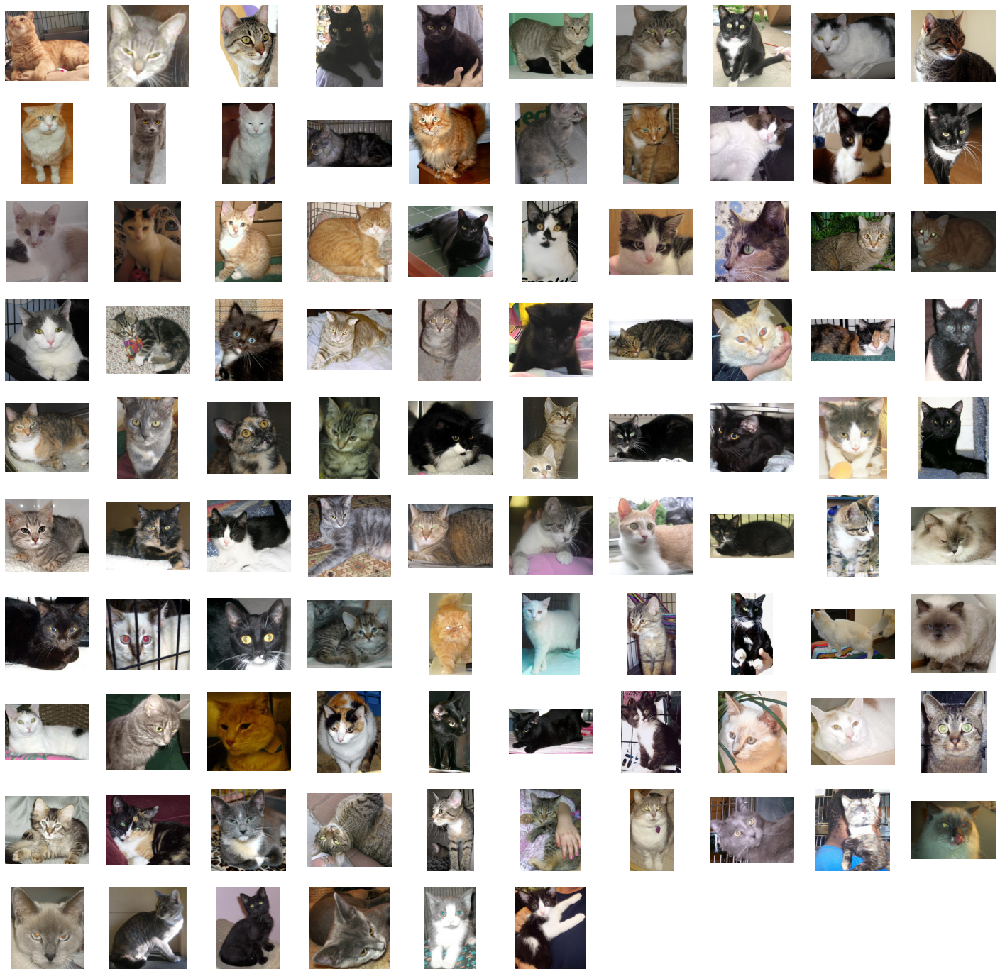

In [68]:
view_cluster(0)


Flower
Размер кластера 101 изображений


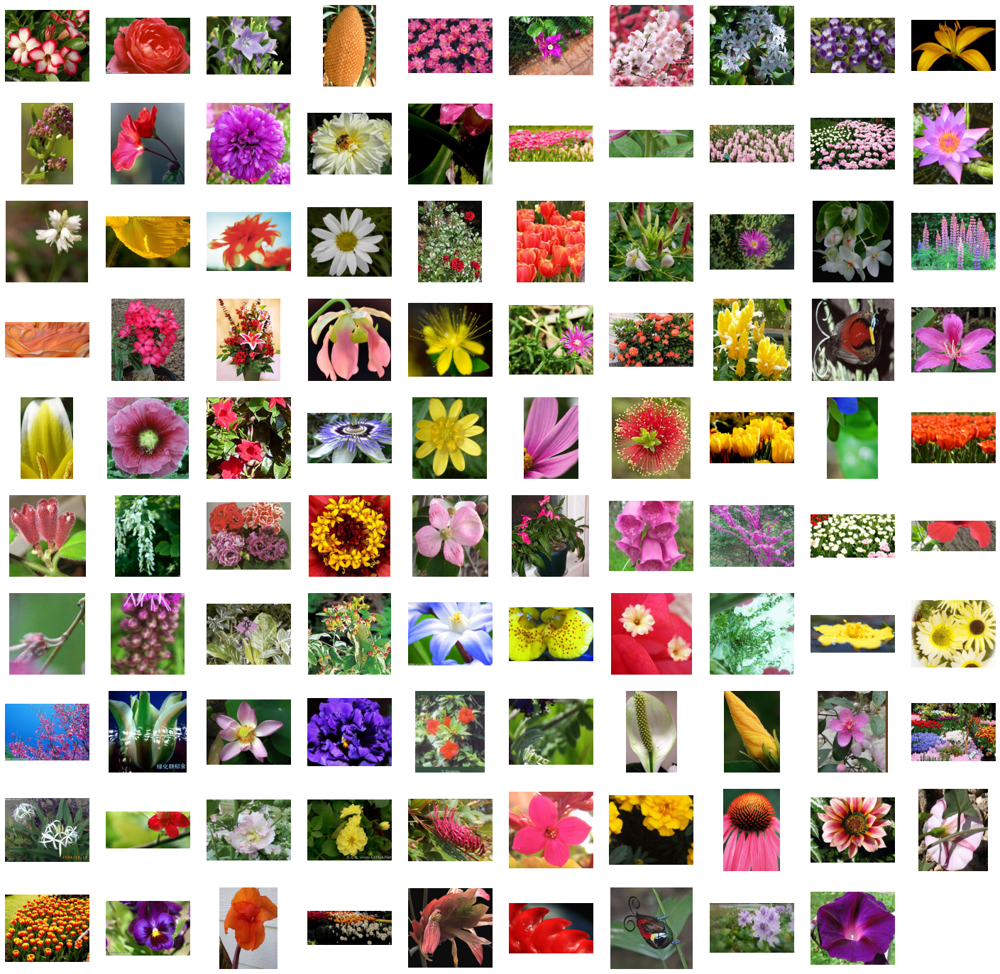

In [69]:
view_cluster(1)

Bird
Размер кластера 100 изображений


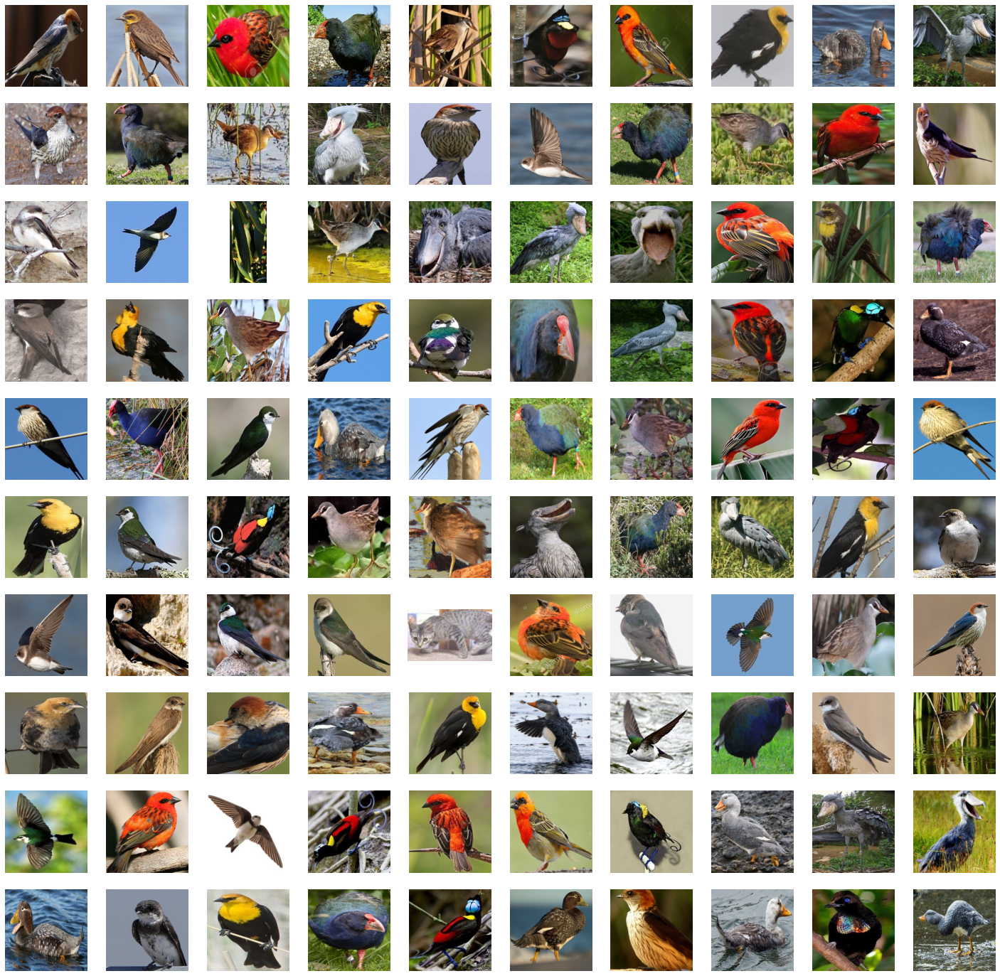

In [70]:
view_cluster(2)

Person
Размер кластера 100 изображений


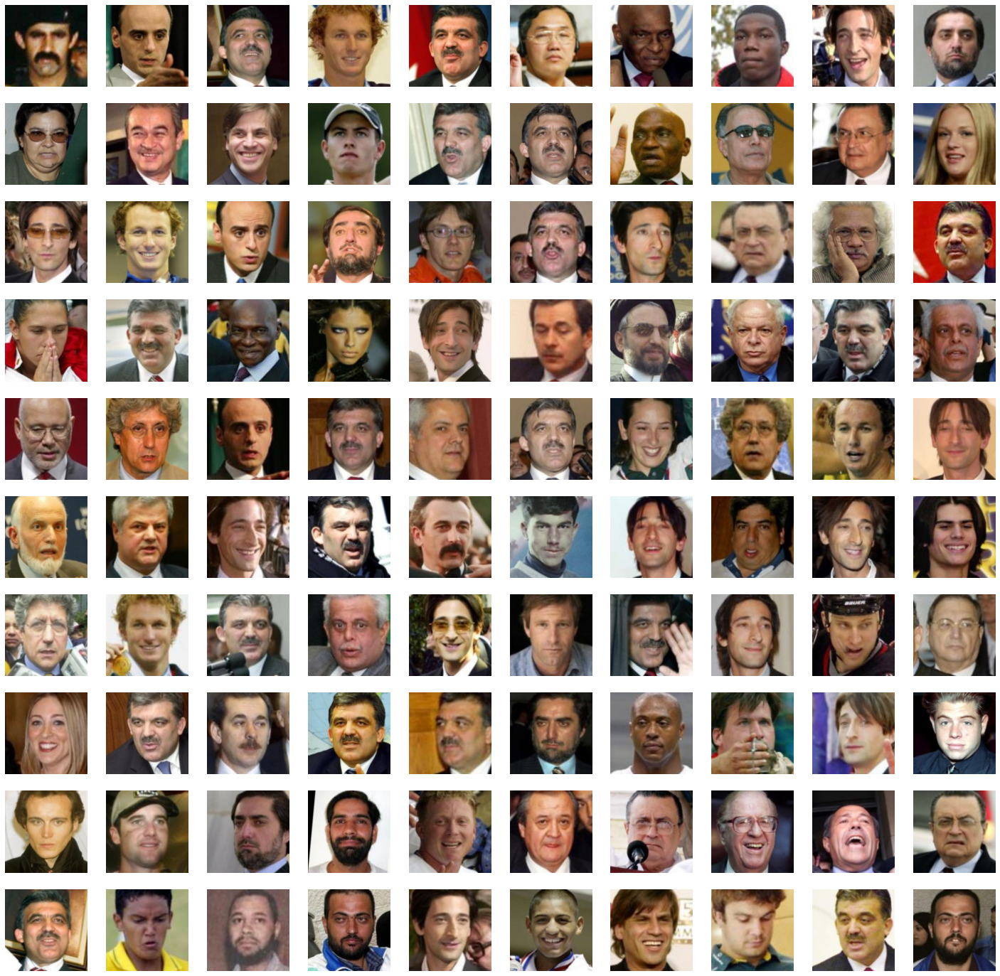

In [71]:
view_cluster(3)

Dog
Размер кластера 103 изображений


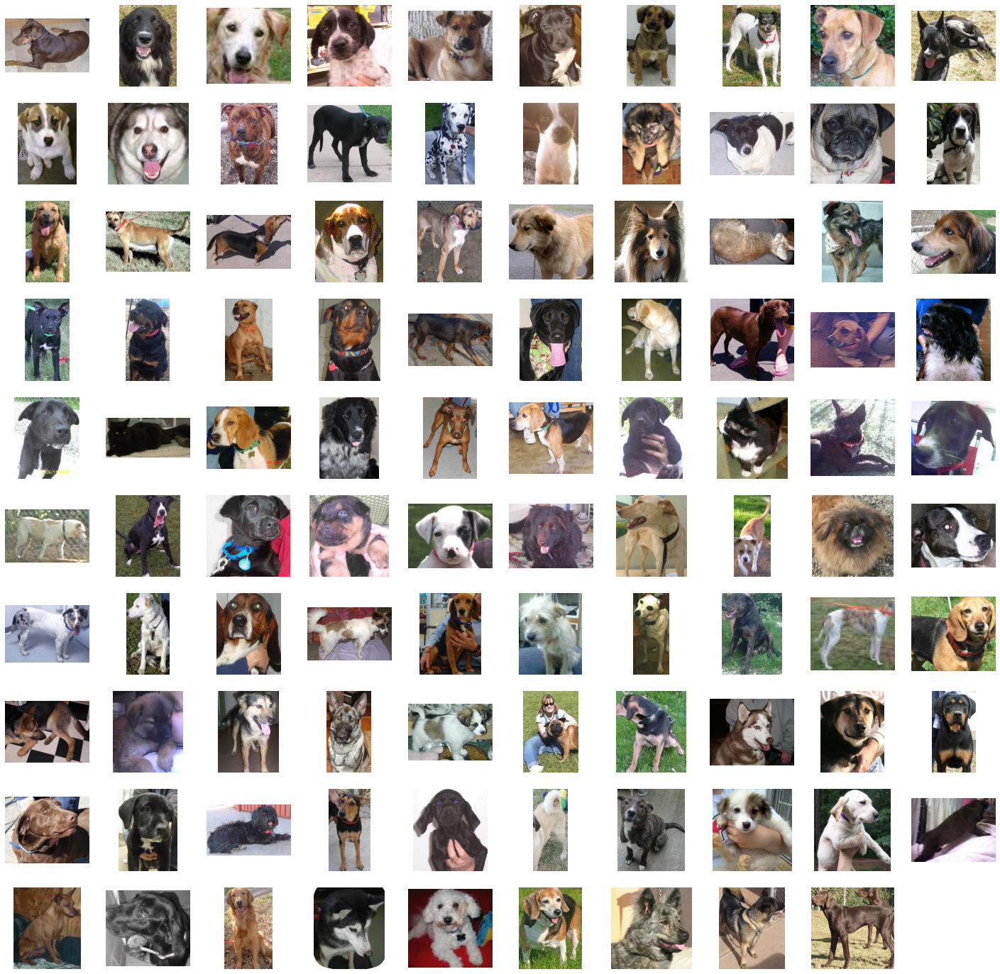

In [72]:
view_cluster(4)